# Restaurant Recommendation Model

## Import all the libraries

In [1]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', 30)

from bs4 import BeautifulSoup

import json # library to handle JSON files

from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

# !pip install folium
import folium
import seaborn as sns

print('Libraries imported.')

Libraries imported.


## Get NYC data

In [2]:
url = "https://cocl.us/new_york_dataset"
newyork_data  = requests.get(url).json()
neighborhoods_data = newyork_data['features']
column_names = ['Borough', 'Neighborhood', 'Latitude', 'Longitude'] 
new_york_neighborhoods = pd.DataFrame(columns=column_names)

for data in neighborhoods_data:
    borough = neighborhood_name = data['properties']['borough'] 
    neighborhood_name = data['properties']['name']
        
    neighborhood_latlon = data['geometry']['coordinates']
    neighborhood_lat = neighborhood_latlon[1]
    neighborhood_lon = neighborhood_latlon[0]
    
    new_york_neighborhoods = new_york_neighborhoods.append({'Borough': borough,
                                          'Neighborhood': neighborhood_name,
                                          'Latitude': neighborhood_lat,
                                          'Longitude': neighborhood_lon}, ignore_index=True)

print("Total rows and columns in Dataframe: ", new_york_neighborhoods.shape)
print("Neighborhoods in New York: ", new_york_neighborhoods.shape[0])
new_york_neighborhoods.head()

Total rows and columns in Dataframe:  (306, 4)
Neighborhoods in New York:  306


,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585


# Initial Data Analysis

In [3]:
address = 'New York City, NY'

geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude

# create map of New York using latitude and longitude values
map_newyork = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, borough, neighborhood in zip(new_york_neighborhoods['Latitude'], new_york_neighborhoods['Longitude'], new_york_neighborhoods['Borough'], new_york_neighborhoods['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_newyork)  
    
map_newyork

## Neighborhoods per Borough 

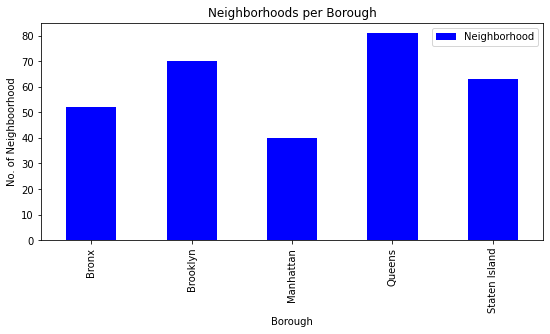

In [4]:
new_york_neighborhoods.groupby('Borough')['Neighborhood'].count().plot.bar(figsize=(9,4), color="blue")
plt.xlabel("Borough")
plt.ylabel("No. of Neighboorhood")
plt.title("Neighborhoods per Borough")
plt.legend()
plt.show()

## Foursquare Credentials and Version

In [5]:
CLIENT_ID = '' # your Foursquare ID
CLIENT_SECRET = '' # your Foursquare Secret
VERSION = '20180605'

print('Credentials Stored')

Credentials Stored


In [6]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    LIMIT = 100 # limit of number of venues returned by Foursquare API
    radius = 500 # define radius
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
        
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

## Get venues for all NYC neighborhoods

In [7]:
nyc_venues = getNearbyVenues(names=new_york_neighborhoods['Neighborhood'],
                                latitudes=new_york_neighborhoods['Latitude'],
                                longitudes=new_york_neighborhoods['Longitude'])

Wakefield
Co-op City
Eastchester
Fieldston
Riverdale
Kingsbridge
Marble Hill
Woodlawn
Norwood
Williamsbridge
Baychester
Pelham Parkway
City Island
Bedford Park
University Heights
Morris Heights
Fordham
East Tremont
West Farms
High  Bridge
Melrose
Mott Haven
Port Morris
Longwood
Hunts Point
Morrisania
Soundview
Clason Point
Throgs Neck
Country Club
Parkchester
Westchester Square
Van Nest
Morris Park
Belmont
Spuyten Duyvil
North Riverdale
Pelham Bay
Schuylerville
Edgewater Park
Castle Hill
Olinville
Pelham Gardens
Concourse
Unionport
Edenwald
Bay Ridge
Bensonhurst
Sunset Park
Greenpoint
Gravesend
Brighton Beach
Sheepshead Bay
Manhattan Terrace
Flatbush
Crown Heights
East Flatbush
Kensington
Windsor Terrace
Prospect Heights
Brownsville
Williamsburg
Bushwick
Bedford Stuyvesant
Brooklyn Heights
Cobble Hill
Carroll Gardens
Red Hook
Gowanus
Fort Greene
Park Slope
Cypress Hills
East New York
Starrett City
Canarsie
Flatlands
Mill Island
Manhattan Beach
Coney Island
Bath Beach
Borough Park
Dyker

In [8]:
nyc_venues.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Wakefield,40.894705,-73.847201,Lollipops Gelato,40.894123,-73.845892,Dessert Shop
1,Wakefield,40.894705,-73.847201,Walgreens,40.896528,-73.844700,Pharmacy
2,Wakefield,40.894705,-73.847201,Carvel Ice Cream,40.890487,-73.848568,Ice Cream Shop
3,Wakefield,40.894705,-73.847201,Subway,40.890468,-73.849152,Sandwich Place
4,Wakefield,40.894705,-73.847201,Rite Aid,40.896649,-73.844846,Pharmacy


In [9]:
nyc_venues.groupby('Neighborhood').count()

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
Allerton,29,29,29,29,29,29
Annadale,10,10,10,10,10,10
Arden Heights,5,5,5,5,5,5
Arlington,5,5,5,5,5,5
Arrochar,16,16,16,16,16,16
...,...,...,...,...,...,...
Woodhaven,22,22,22,22,22,22
Woodlawn,21,21,21,21,21,21
Woodrow,18,18,18,18,18,18


# Find if there are any Indian Restaurants in the venues?

In [10]:
"Indian Restaurant" in nyc_venues['Venue Category'].unique()

True

## Analyze Each Neighborhood

In [11]:
# one hot encoding
nyc_to_onehot = pd.get_dummies(nyc_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
nyc_to_onehot['Neighborhoods'] = nyc_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [nyc_to_onehot.columns[-1]] + list(nyc_to_onehot.columns[:-1])
nyc_to_onehot = nyc_to_onehot[fixed_columns]

print(nyc_to_onehot.shape)
nyc_to_onehot.head()

(9544, 429)


,Neighborhoods,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,American Restaurant,Animal Shelter,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,...,Video Game Store,Video Store,Vietnamese Restaurant,Volleyball Court,Warehouse Store,Waste Facility,Waterfront,Weight Loss Center,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yemeni Restaurant,Yoga Studio
0,Wakefield,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,Wakefield,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Wakefield,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,Wakefield,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,Wakefield,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


## Group rows by neighborhood and by taking the mean of the frequency of occurrence of each category

In [12]:
nyc_grouped = nyc_to_onehot.groupby('Neighborhoods').mean().reset_index()
nyc_grouped.head()

,Neighborhoods,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,American Restaurant,Animal Shelter,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,...,Video Game Store,Video Store,Vietnamese Restaurant,Volleyball Court,Warehouse Store,Waste Facility,Waterfront,Weight Loss Center,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yemeni Restaurant,Yoga Studio
0,Allerton,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,Annadale,0.0,0.0,0.0,0.0,0.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,Arden Heights,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,Arlington,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,Arrochar,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [13]:
indian_restaurant_freq = nyc_grouped[["Neighborhoods","Indian Restaurant"]].rename(columns={'Neighborhoods':'Neighborhood'})
indian_restaurant_freq.head()

,Neighborhood,Indian Restaurant
0,Allerton,0.0
1,Annadale,0.0
2,Arden Heights,0.0
3,Arlington,0.0
4,Arrochar,0.0


# Now we will cluster the neighborhoods using k-means clustering.

In [14]:
from sklearn.cluster import KMeans
# set number of clusters
kclusters = 4
nyc_indian_grouped_clustering = indian_restaurant_freq.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=6).fit(nyc_indian_grouped_clustering)
kmeans.labels_[0:10]

array([0, 0, 0, 0, 0, 0, 3, 0, 0, 0], dtype=int32)

In [15]:
to_merged = indian_restaurant_freq.copy()

# add clustering labels
to_merged["Cluster Labels"] = kmeans.labels_

In [16]:
to_merged.head()

,Neighborhood,Indian Restaurant,Cluster Labels
0,Allerton,0.0,0
1,Annadale,0.0,0
2,Arden Heights,0.0,0
3,Arlington,0.0,0
4,Arrochar,0.0,0


In [17]:
to_merged = to_merged.join(nyc_venues.set_index("Neighborhood"), on="Neighborhood")

print(to_merged.shape)
to_merged.head()

(9544, 9)


,Neighborhood,Indian Restaurant,Cluster Labels,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Allerton,0.0,0,40.865788,-73.859319,Domenick's Pizzeria,40.865576,-73.858124,Pizza Place
0,Allerton,0.0,0,40.865788,-73.859319,White Castle,40.866065,-73.862307,Fast Food Restaurant
0,Allerton,0.0,0,40.865788,-73.859319,Sal & Doms Bakery,40.865377,-73.855236,Dessert Shop
0,Allerton,0.0,0,40.865788,-73.859319,Domino's Pizza,40.866363,-73.861798,Pizza Place
0,Allerton,0.0,0,40.865788,-73.859319,Dollar Tree,40.866239,-73.861546,Discount Store


In [18]:
to_merged['Venue Category'].value_counts()['Indian Restaurant']
to_merged.shape

(9544, 9)

In [19]:
# create map of New York using latitude and longitude values
map_cluster = folium.Map(location=[latitude, longitude], zoom_start=10.5)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]


# add markers to map
for lat, lon, poi, cluster in zip(to_merged['Neighborhood Latitude'], to_merged['Neighborhood Longitude'], to_merged['Neighborhood'], to_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_cluster) 
    
map_cluster

In [20]:
indian_restaurant_freq["Cluster Labels"] = kmeans.labels_
indian_restaurant_freq.head()

,Neighborhood,Indian Restaurant,Cluster Labels
0,Allerton,0.0,0
1,Annadale,0.0,0
2,Arden Heights,0.0,0
3,Arlington,0.0,0
4,Arrochar,0.0,0


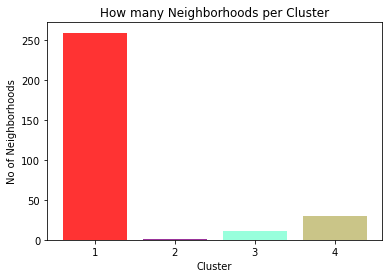

In [21]:
objects = (1,2,3,4)
y_pos = np.arange(len(objects))
performance = indian_restaurant_freq['Cluster Labels'].value_counts().to_frame().sort_index(ascending=True)
perf = performance['Cluster Labels'].tolist()
plt.bar(y_pos, perf, align='center', alpha=0.8, color=['red', 'purple','aquamarine', 'darkkhaki'])
plt.xticks(y_pos, objects)
plt.ylabel('No of Neighborhoods')
plt.xlabel('Cluster')
plt.title('How many Neighborhoods per Cluster')

plt.show()

In [22]:
indian_restaurant_freq['Cluster Labels'].value_counts()

0    259
3     30
2     11
1      1
Name: Cluster Labels, dtype: int64

# Analysis of each Cluster

In [23]:
df_new = new_york_neighborhoods[['Borough', 'Neighborhood']]
df_new.head()

,Borough,Neighborhood
0,Bronx,Wakefield
1,Bronx,Co-op City
2,Bronx,Eastchester
3,Bronx,Fieldston
4,Bronx,Riverdale


## Cluster 1 : Red

In [24]:
cluster1 = to_merged.loc[to_merged['Cluster Labels'] == 0]
df_cluster1 = pd.merge(df_new, cluster1, on='Neighborhood')
df_cluster1.sort_values(["Indian Restaurant"], ascending=False)

,Borough,Neighborhood,Indian Restaurant,Cluster Labels,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
2844,Manhattan,Murray Hill,0.007407,0,40.748303,-73.978332,The Kitano Hotel New York,40.749567,-73.979673,Hotel
2898,Manhattan,Murray Hill,0.007407,0,40.764126,-73.812763,Hahm Ji Bach - 함지박,40.763022,-73.815042,Korean Restaurant
2900,Manhattan,Murray Hill,0.007407,0,40.764126,-73.812763,Paradise Alley,40.762603,-73.814287,Bar
2901,Manhattan,Murray Hill,0.007407,0,40.764126,-73.812763,Chase Bank,40.764971,-73.811369,Bank
2902,Manhattan,Murray Hill,0.007407,0,40.764126,-73.812763,H Mart,40.763239,-73.809126,Supermarket
...,...,...,...,...,...,...,...,...,...,...
2234,Brooklyn,Fort Hamilton,0.000000,0,40.614768,-74.031979,Fort Hamilton Diner,40.616074,-74.031135,Diner
2233,Brooklyn,Fort Hamilton,0.000000,0,40.614768,-74.031979,Mike's Deli,40.615796,-74.031334,Deli / Bodega
2232,Brooklyn,Fort Hamilton,0.000000,0,40.614768,-74.031979,The UPS Store,40.618189,-74.033520,Shipping Store
2231,Brooklyn,Fort Hamilton,0.000000,0,40.614768,-74.031979,Goustaro,40.617774,-74.030451,Deli / Bodega


## Cluster 2 : Purple

In [25]:
cluster2=to_merged.loc[to_merged['Cluster Labels'] == 1]
df_cluster2 = pd.merge(df_new, cluster2, on='Neighborhood')
df_cluster2.sort_values(["Indian Restaurant"], ascending=False)

,Borough,Neighborhood,Indian Restaurant,Cluster Labels,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Queens,Floral Park,0.428571,1,40.741378,-73.708847,Apna Bazar,40.737122,-73.708104,Grocery Store
1,Queens,Floral Park,0.428571,1,40.741378,-73.708847,80th Avenue Playgroud,40.743912,-73.709948,Playground
2,Queens,Floral Park,0.428571,1,40.741378,-73.708847,Flavor Of India,40.737425,-73.708540,Indian Restaurant
3,Queens,Floral Park,0.428571,1,40.741378,-73.708847,MS 172,40.740887,-73.713336,Basketball Court
4,Queens,Floral Park,0.428571,1,40.741378,-73.708847,Real Usha Sweets & Snacks Inc.,40.737432,-73.708640,Indian Restaurant
5,Queens,Floral Park,0.428571,1,40.741378,-73.708847,Dolly's Beauty Salon,40.737449,-73.708211,Salon / Barbershop
6,Queens,Floral Park,0.428571,1,40.741378,-73.708847,Namaste Restaurant and Cafe,40.737173,-73.709756,Indian Restaurant


## Cluster 3 : Turquoise

In [26]:
cluster3 = to_merged.loc[to_merged['Cluster Labels'] == 2]
df_cluster3 = pd.merge(df_new, cluster3, on='Neighborhood')
df_cluster3.sort_values(["Indian Restaurant"], ascending=False)

,Borough,Neighborhood,Indian Restaurant,Cluster Labels,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
291,Queens,Briarwood,0.083333,2,40.710935,-73.811748,Briarwood's Courtyard,40.709641,-73.814012,Plaza
298,Queens,Briarwood,0.083333,2,40.710935,-73.811748,Moon Tikka,40.713202,-73.807214,Indian Restaurant
297,Queens,Briarwood,0.083333,2,40.710935,-73.811748,"MTABus Q25, Q34 (Parsons Blvd/84th Rd-Hoover A...",40.712209,-73.806774,Bus Station
296,Queens,Briarwood,0.083333,2,40.710935,-73.811748,Sweat Box Gym,40.709734,-73.807460,Gym
295,Queens,Briarwood,0.083333,2,40.710935,-73.811748,Parsons Discount Store,40.709694,-73.807529,Convenience Store
...,...,...,...,...,...,...,...,...,...,...
71,Brooklyn,Clinton Hill,0.036145,2,40.693229,-73.967843,Key Food,40.693527,-73.965183,Market
72,Brooklyn,Clinton Hill,0.036145,2,40.693229,-73.967843,Dino,40.689535,-73.970466,Italian Restaurant
73,Brooklyn,Clinton Hill,0.036145,2,40.693229,-73.967843,Maison May,40.689466,-73.969291,French Restaurant
74,Brooklyn,Clinton Hill,0.036145,2,40.693229,-73.967843,Blick Art Materials,40.693445,-73.963723,Arts & Crafts Store


## Cluster 4 : Dark-Khaki

In [27]:
cluster4 = to_merged.loc[to_merged['Cluster Labels'] == 3]
df_cluster4 = pd.merge(df_new, cluster4, on='Neighborhood')
df_cluster4.sort_values(["Indian Restaurant"], ascending=False)

,Borough,Neighborhood,Indian Restaurant,Cluster Labels,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
1435,Manhattan,Greenwich Village,0.030000,3,40.726933,-73.999914,Terra Blues,40.728288,-73.999381,Jazz Club
1498,Manhattan,Greenwich Village,0.030000,3,40.726933,-73.999914,Charlie Bird,40.727802,-74.002850,Italian Restaurant
1508,Manhattan,Greenwich Village,0.030000,3,40.726933,-73.999914,Shobha,40.724869,-73.996868,Spa
1507,Manhattan,Greenwich Village,0.030000,3,40.726933,-73.999914,Hello Saigon,40.729020,-74.000942,Vietnamese Restaurant
1506,Manhattan,Greenwich Village,0.030000,3,40.726933,-73.999914,Comedy Cellar,40.730130,-74.000402,Comedy Club
...,...,...,...,...,...,...,...,...,...,...
1420,Staten Island,Chelsea,0.009434,3,40.744035,-74.003116,Posman Books,40.742906,-74.006764,Bookstore
1419,Staten Island,Chelsea,0.009434,3,40.744035,-74.003116,Diane Von Furstenberg,40.741426,-74.007212,Women's Store
1418,Staten Island,Chelsea,0.009434,3,40.744035,-74.003116,Zucker's Bagels,40.744760,-73.998540,Bagel Shop
1417,Staten Island,Chelsea,0.009434,3,40.744035,-74.003116,New York Live Arts,40.742118,-73.998268,Theater


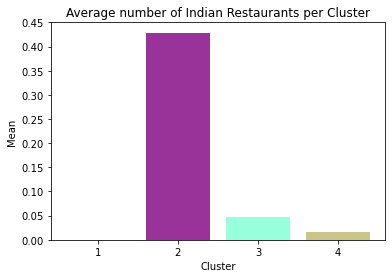

In [28]:
clusters_mean = [df_cluster1['Indian Restaurant'].mean(),df_cluster2['Indian Restaurant'].mean(),df_cluster3['Indian Restaurant'].mean(),
                 df_cluster4['Indian Restaurant'].mean()]
objects = (1,2,3,4)
y_pos = np.arange(len(objects))
perf = clusters_mean
plt.bar(y_pos, perf, align='center', alpha=0.8, color=['red', 'purple','aquamarine', 'darkkhaki'])
plt.xticks(y_pos, objects)
plt.ylabel('Mean')
plt.xlabel('Cluster')
plt.title('Average number of Indian Restaurants per Cluster')

plt.show()

## Observations

Cluster 1 (Red) 259 neighborhoods, 394 unique Venue Category but only two Indian restaurants. Cluster 1 has lowest average of Indian Restaurants equating to 0.0003.

Cluster 2 (Purple) has 7 neighborhoods, 5 unique Venue Category out of which 3 were Indian restaurants. Cluster 2 has highest average of Indian Restaurants equating to 0.43.

Cluster 3 (Turquoise) has 361 neighborhoods, 114 unique Venue Category out of which 17 were Indian restaurants. Cluster 3 has 2nd lowest average of Indian Restaurants equating to 0.047.

Cluster 4 (Dark-Khaki) has 30 neighborhoods, 293 unique Venue Category out of which 40 were Indian restaurants. Cluster 3 has 2nd highest average of Indian Restaurants equating to 0.047.
